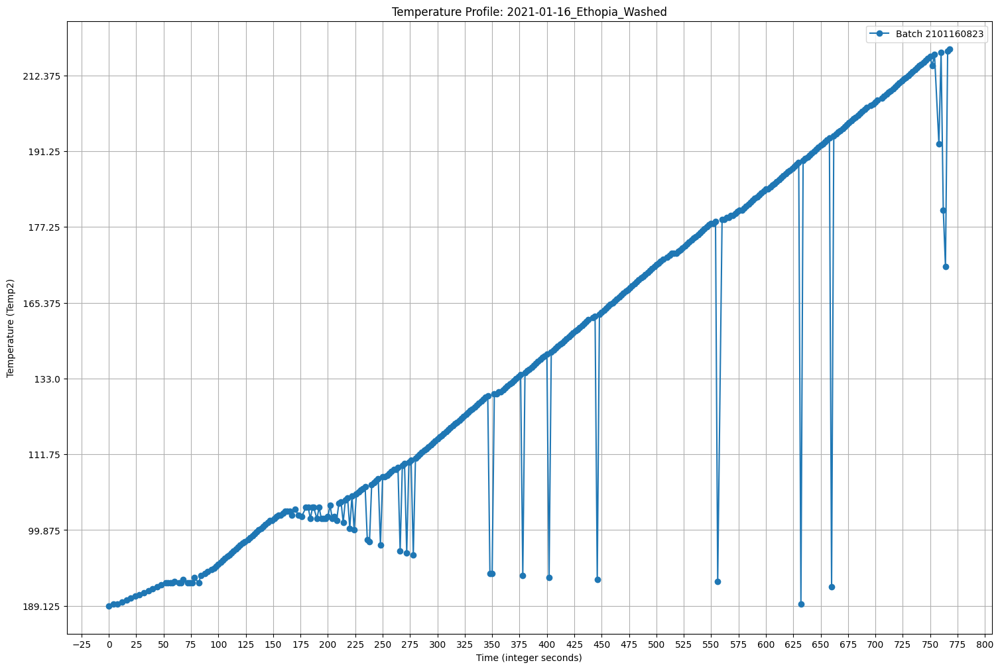

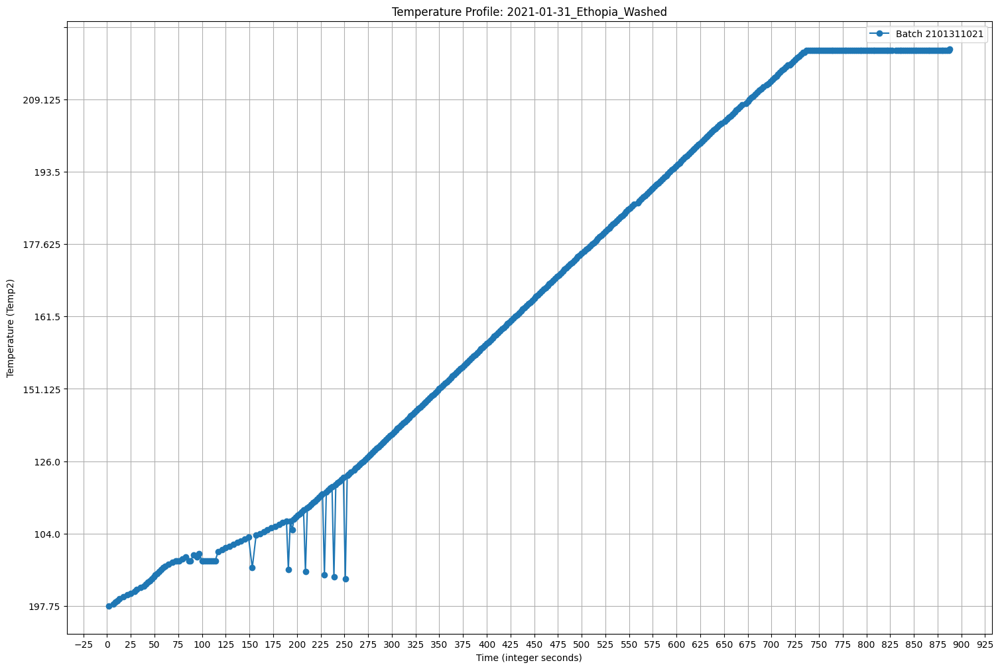

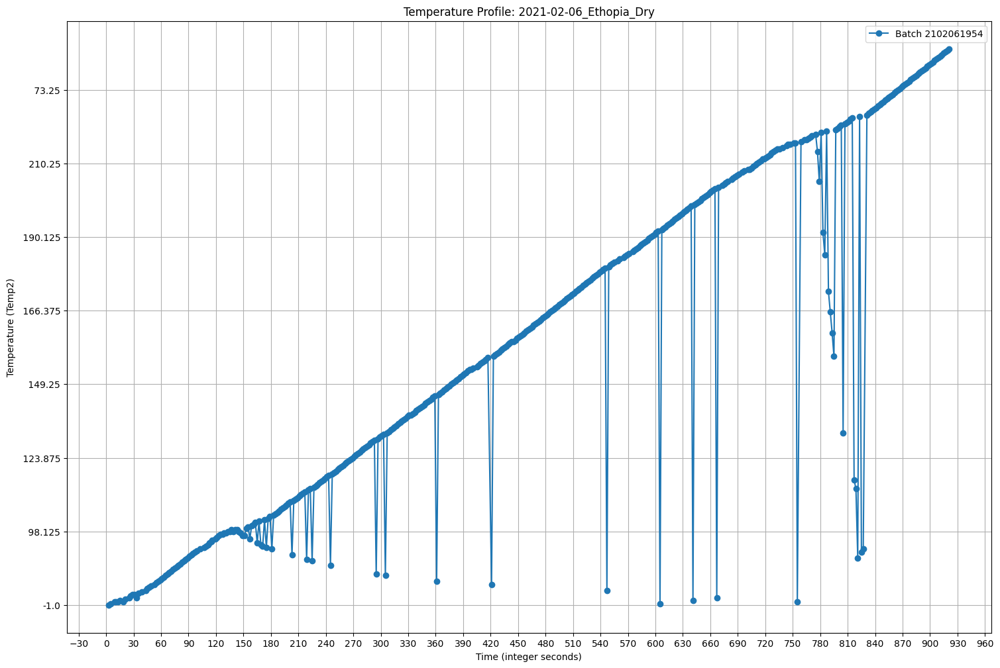

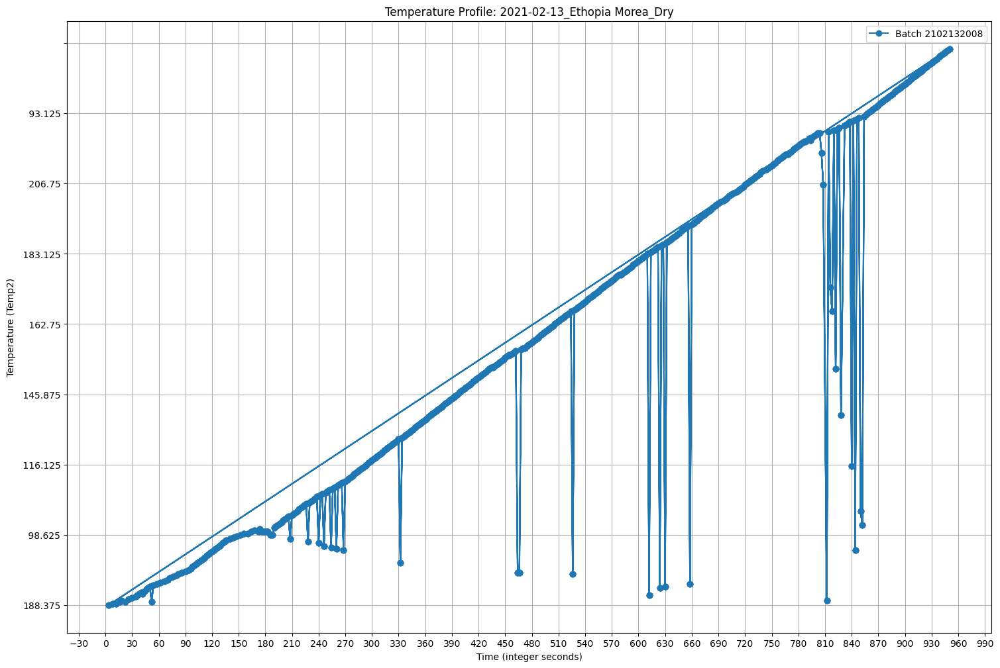

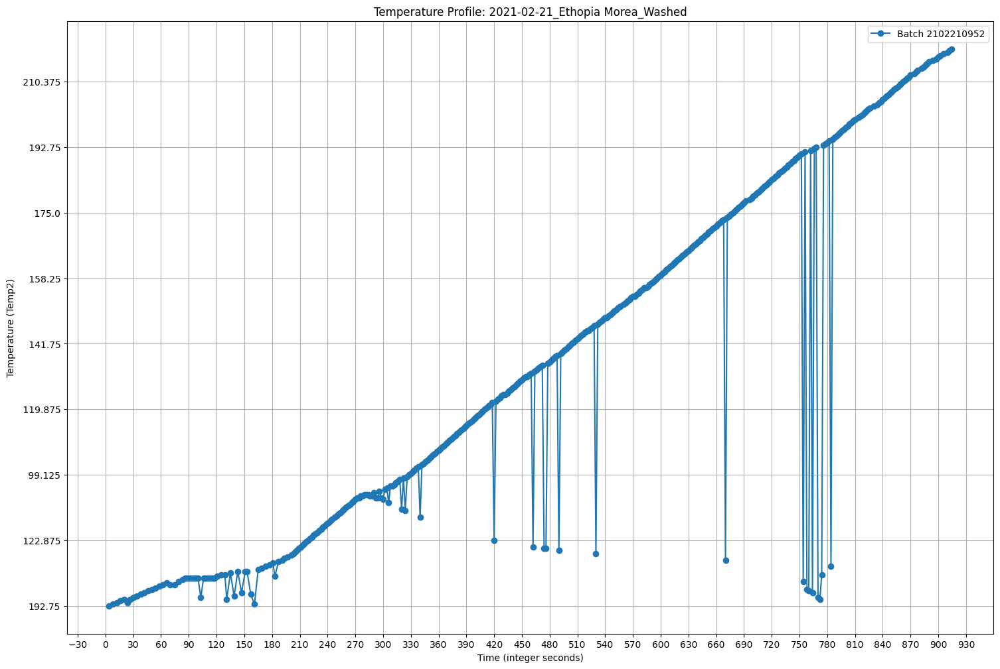

...

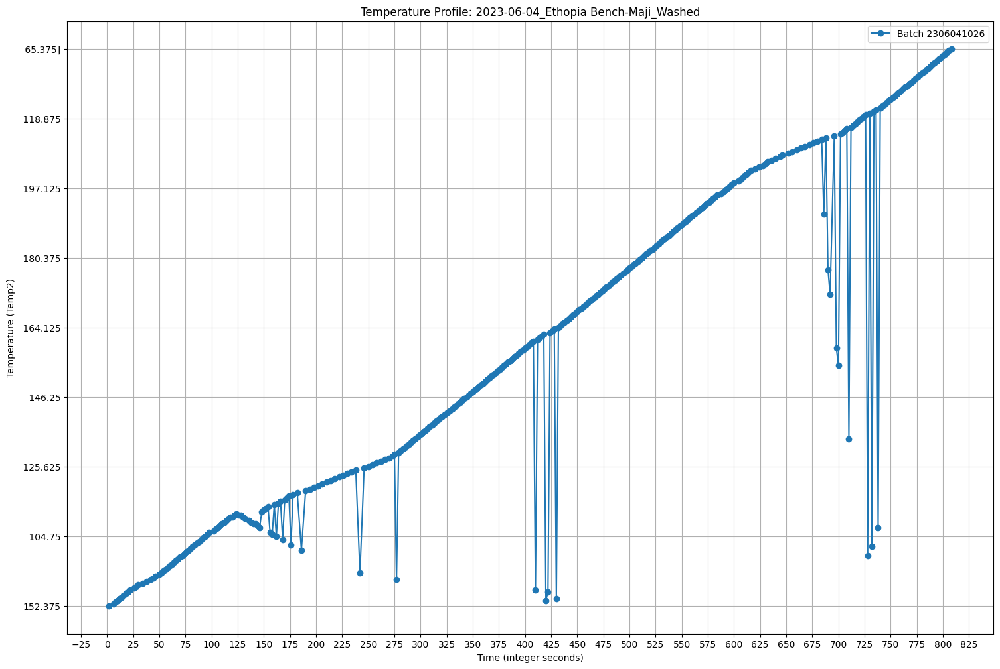

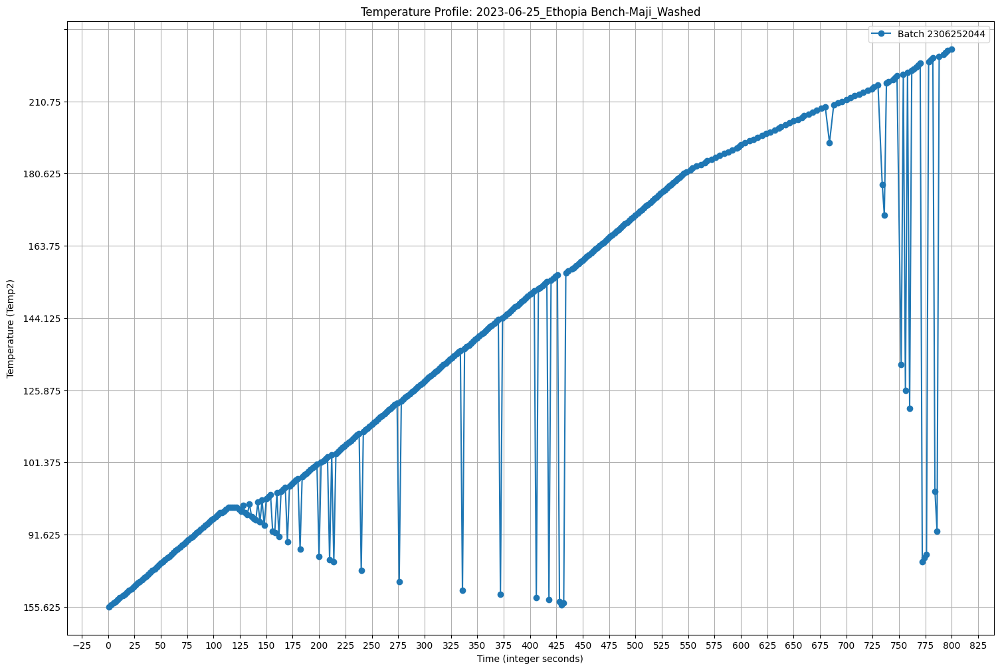

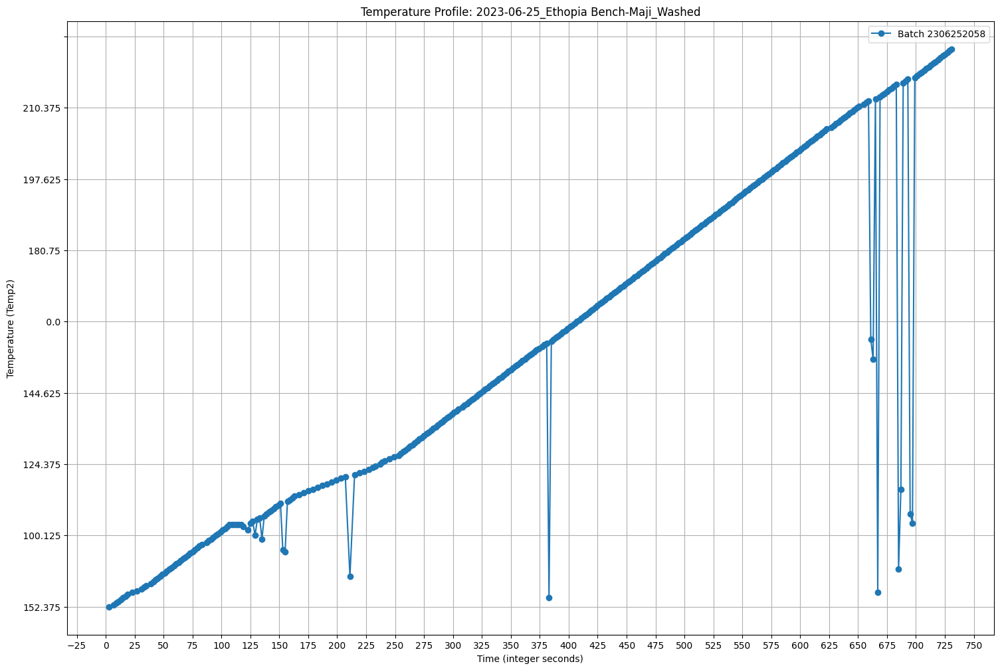

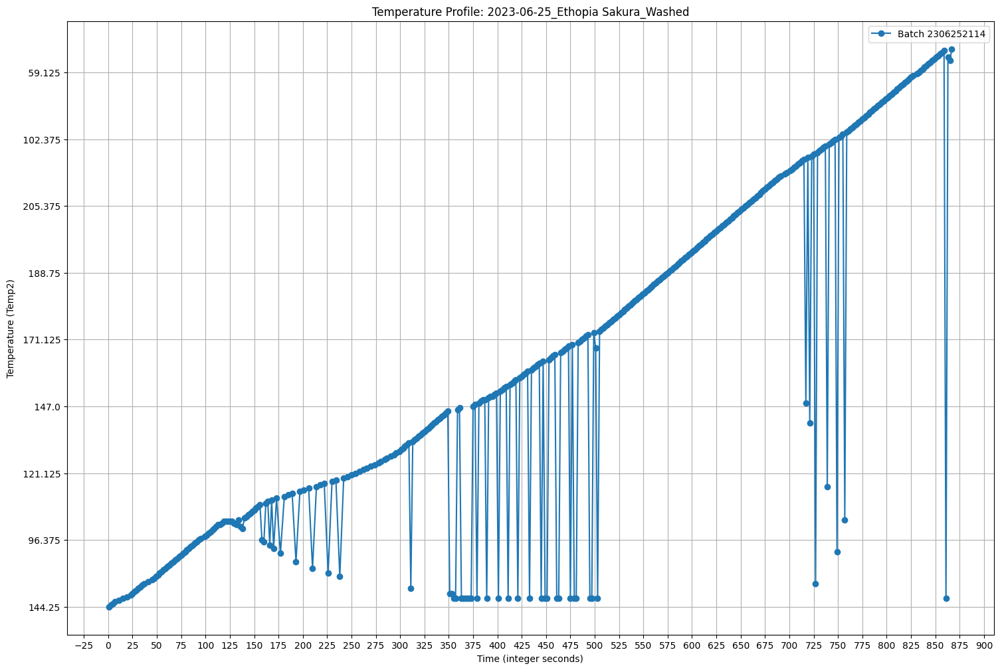

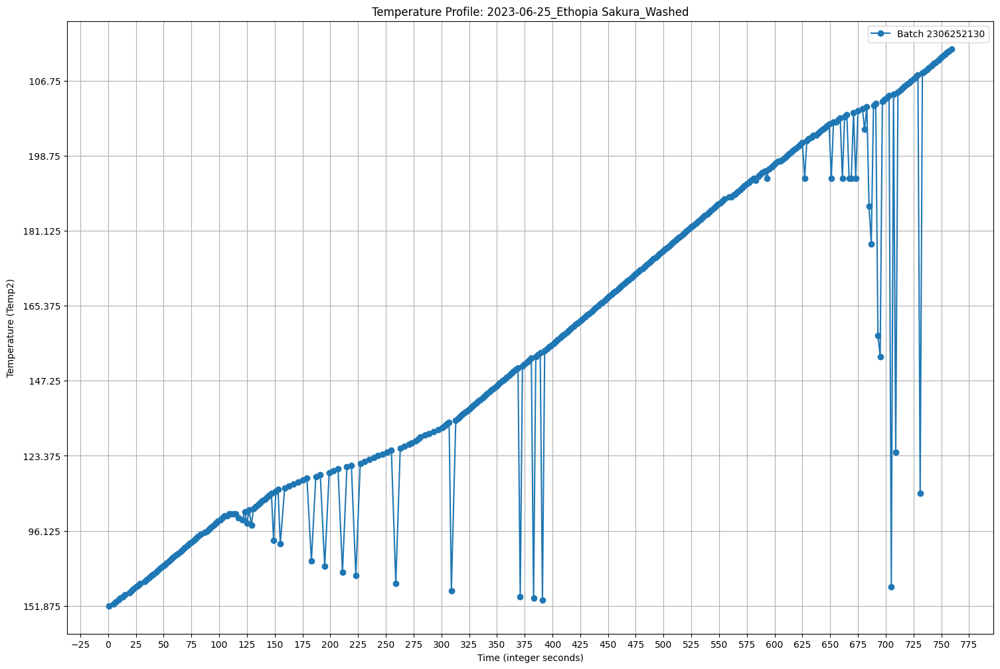

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator  # Import MaxNLocator

# Load the data, specifying the delimiter as semicolon
df = pd.read_csv("SQL.csv", delimiter=";")

# Clean column names by removing extra spaces and converting them to lowercase
df.columns = df.columns.str.strip().str.lower()

# Ensure that the 'time' column is numeric and convert to integers
df['time'] = pd.to_numeric(df['time'], errors='coerce').fillna(0).astype(int)

# Ensure the data contains 'roasting_batch_id'
if 'roasting_batch_id' not in df.columns:
    if 'timestamp' in df.columns:  # Ensure 'timestamp' exists
        df['roasting_batch_id'] = df['timestamp'].apply(
            lambda ts: pd.to_datetime(ts).strftime("%y%m%d%H%M")
        )
    else:
        print("Error: 'timestamp' column is missing.")
        raise KeyError("Missing 'timestamp' column in the dataset.")

# Iterate over each group of 'roasting_batch_id' data
for roasting_batch_id, group in df.groupby('roasting_batch_id'):
    # Ensure the data is not empty
    if not group.empty:
        # Extract time and temp2 values
        times = group['time']
        temp2 = group['temp2']

        # Get the name in the format timestamp_bean_type_process_type
        timestamp = group['timestamp'].iloc[0].split(" ")[0]  # Ensure column name matches
        bean_type = group['bean_type'].iloc[0]
        process_type = group['process_type'].iloc[0]
        plot_name = f"{timestamp}_{bean_type}_{process_type}"

        # Plot the line chart
        plt.figure(figsize=(18, 12))
        plt.plot(times, temp2, marker='o', linestyle='-', label=f"Batch {roasting_batch_id}")
        plt.title(f"Temperature Profile: {plot_name}")
        plt.xlabel("Time (integer seconds)")
        plt.ylabel("Temperature (Temp2)")
        plt.grid(True)
        plt.legend()

        # Set y-axis ticks
        plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True, nbins=10))
        # Set x-axis ticks
        plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True, nbins=40))

        # Save or display the plot
        # plt.savefig(f"{plot_name}.png") 
        plt.show()
